In [27]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')

import json
import pickle
import torch
import scanpy as sc

PATH = f'/home/luca/Documents/data/'

#'/cluster/CBIO/data1/lgortana/'
#'/home/luca/Documents/data/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load data

In [28]:
#load adata
adata_name = 'CytAssist_11mm_FFPE_Human_Ovarian_Carcinoma'
data_path = PATH + adata_name
path_ST_adata = data_path + '/ST'
adata = sc.read_visium(path_ST_adata)

#load segmentation
json_path = data_path + '/seg_json/consep_original_mask_lvl3_nolabel.json'
with open(json_path) as json_file:
    hovernet_dict = json.load(json_file)

/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [29]:
#load images   
image_path = data_path + '/tif/CytAssist_11mm_FFPE_Human_Ovarian_Carcinoma_tissue_image.tif'
image_dict = torch.load(data_path + "/image_dict_64.pt")

In [30]:
#load model infos
model_dir = '../models/alpha_0_lr_1e-5_weights_False_divergence_kl_conv/'

with open(model_dir + 'info.pickle', 'rb') as f:
    model_info = pickle.load(f)

# model_info["preds"] = {"pred_best": model_info["pred_best"], 
#                        "pred_best_adjusted": model_info["pred_best_adjusted"], 
#                        "pred_final": model_info["pred_final"], 
#                        "pred_final_adjusted": model_info["pred_final_adjusted"]}

# del model_info["pred_best"]
# del model_info["pred_best_adjusted"]
# del model_info["pred_final"]
# del model_info["pred_final_adjusted"]

In [31]:
from deconvplugin.analysis import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info)

Loading predicted labels...
-> ok
Use `add_attributes(history=your_history)` to add one.
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


In [32]:
import pandas as pd
pd.DataFrame(analyzer.proportions.mean(axis=0)).T

,fibroblast,T cell,mast cell,endothelial cell,B cell,dendritic cell,plasma cell,cancer cell,monocyte
0,0.145212,0.023478,0.030576,0.018726,0.005089,0.005257,0.012452,0.731563,0.027647


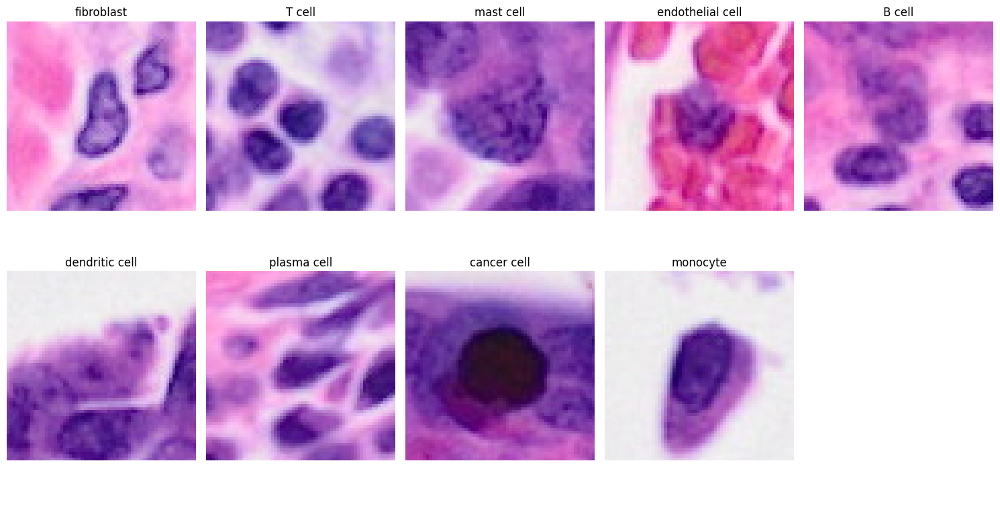

In [33]:
import matplotlib.pyplot as plt
from deconvplugin.plots import plot_cell

n_cols = 5
n_rows = (len(analyzer.ct_list) + n_cols - 1) // n_cols

fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows * 4))
axs = axs.flatten()

for i, cell_type in enumerate(analyzer.ct_list):
    cell_id = analyzer.find_cell_max_cell_type(cell_type)
    ax = axs[i]
    plot_cell(image_dict, ax=ax, cell_id=cell_id)
    ax.set_title(cell_type, fontsize=12)

# Turn off axes for unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

In [34]:
analyzer.add_attributes(image_dict = image_dict,
                        adata = adata,
                        adata_name = adata_name,
                        image_path = image_path,
                        seg_dict = hovernet_dict)

In [44]:
from deconvplugin.postseg import StdVisualizer

plotter = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        dict_cells = analyzer.seg_dict)

Visium data found.


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.


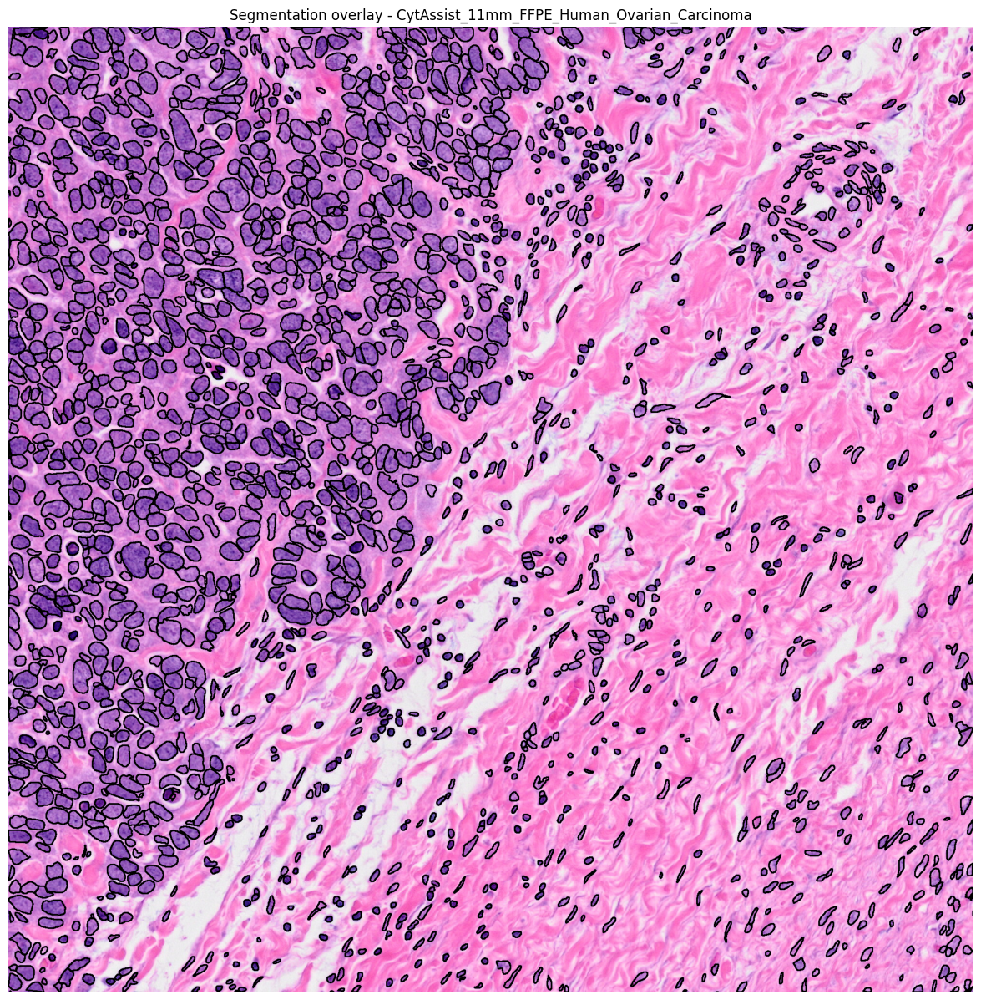

In [48]:
window = ((25000, 4000), (2000, 2000)) #((25000, 4000), (2000, 2000))
plotter.plot_seg(window, show_visium=False)

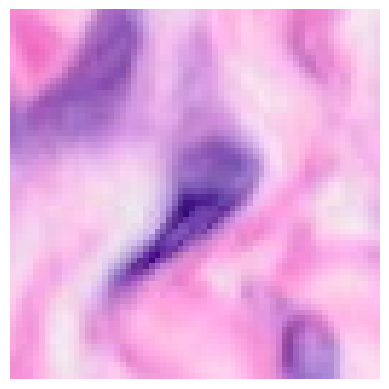

In [73]:
from deconvplugin.plots import plot_cell

plot_cell(image_dict)

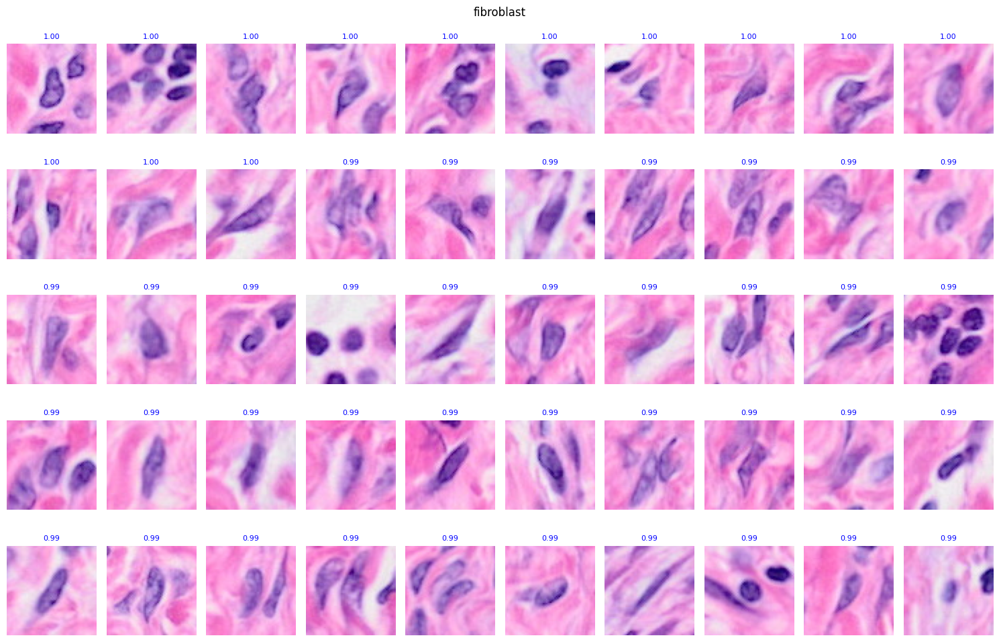

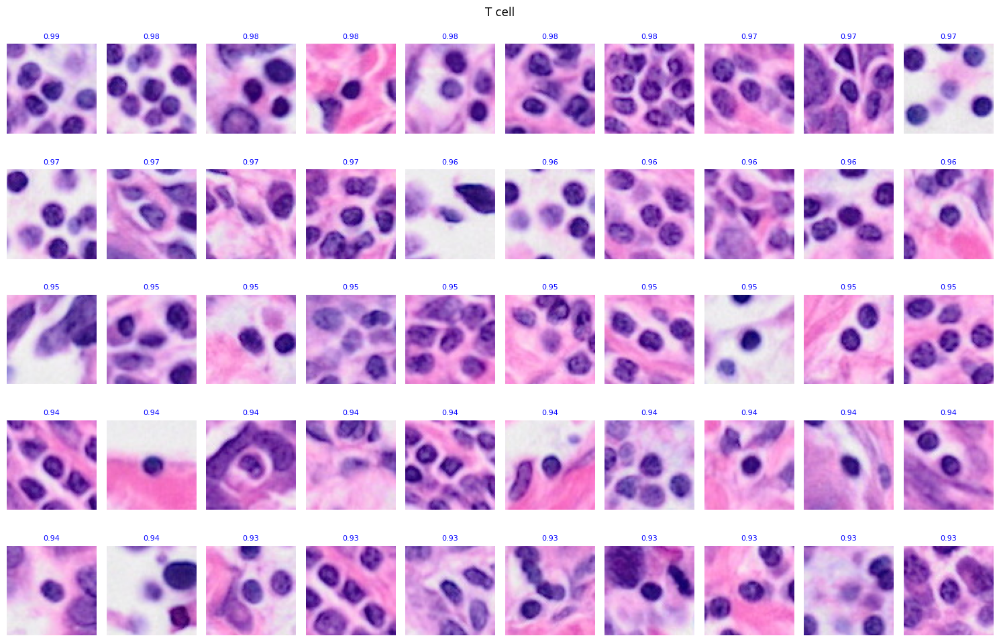

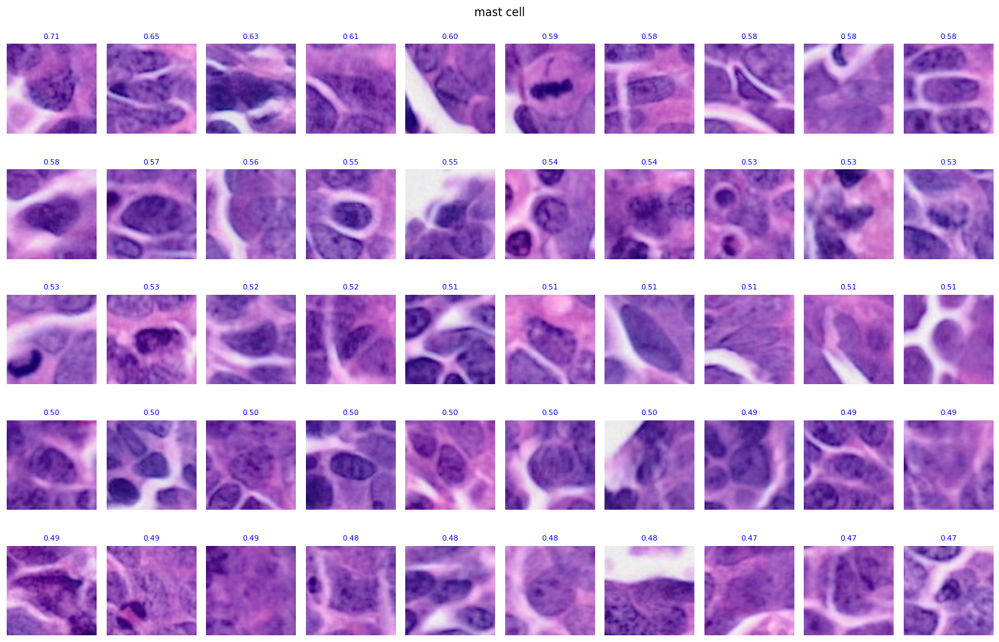

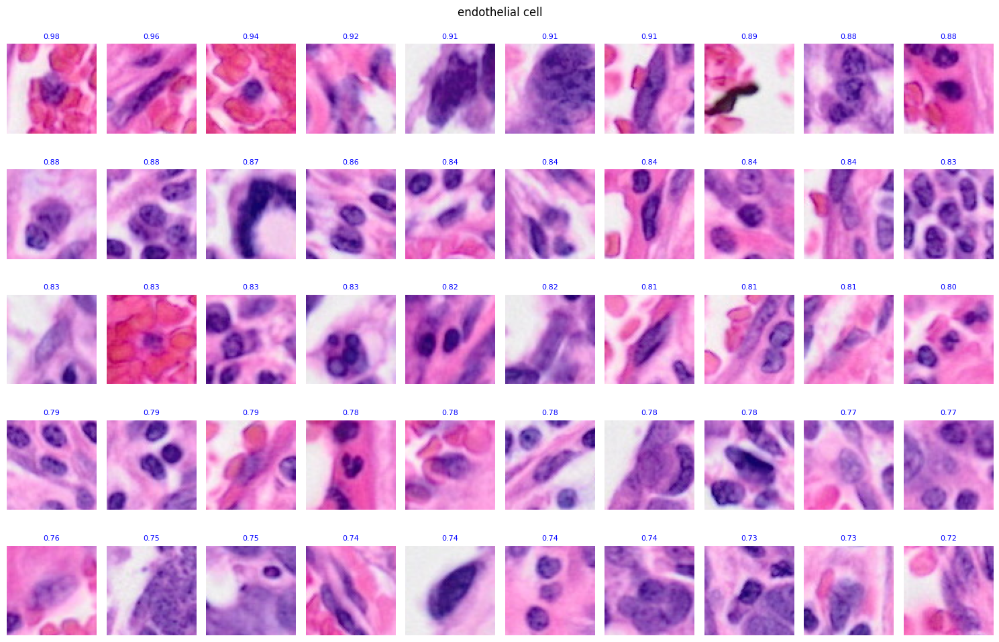

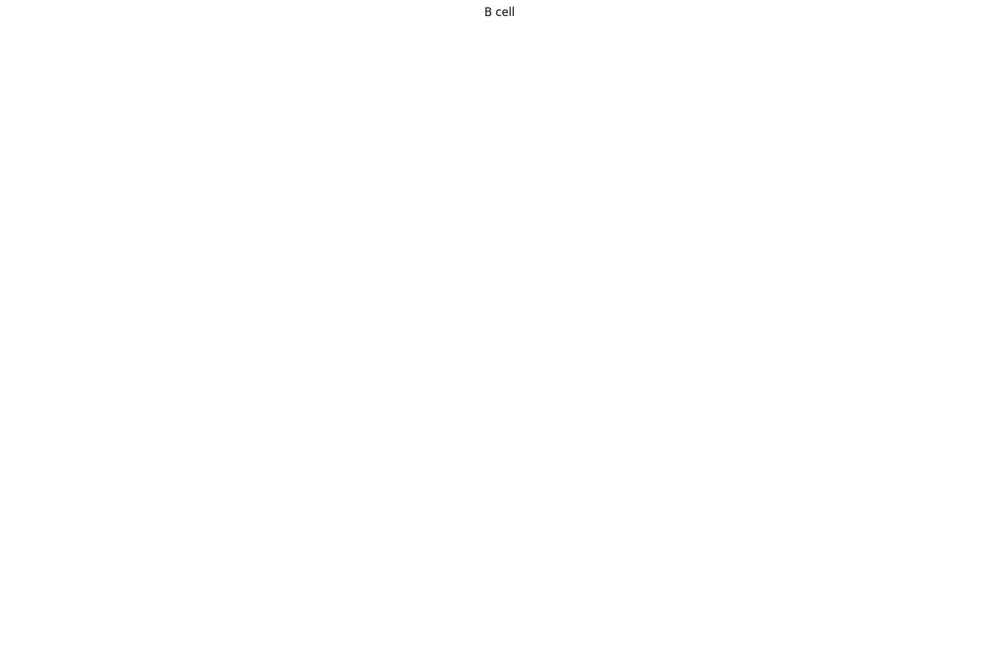

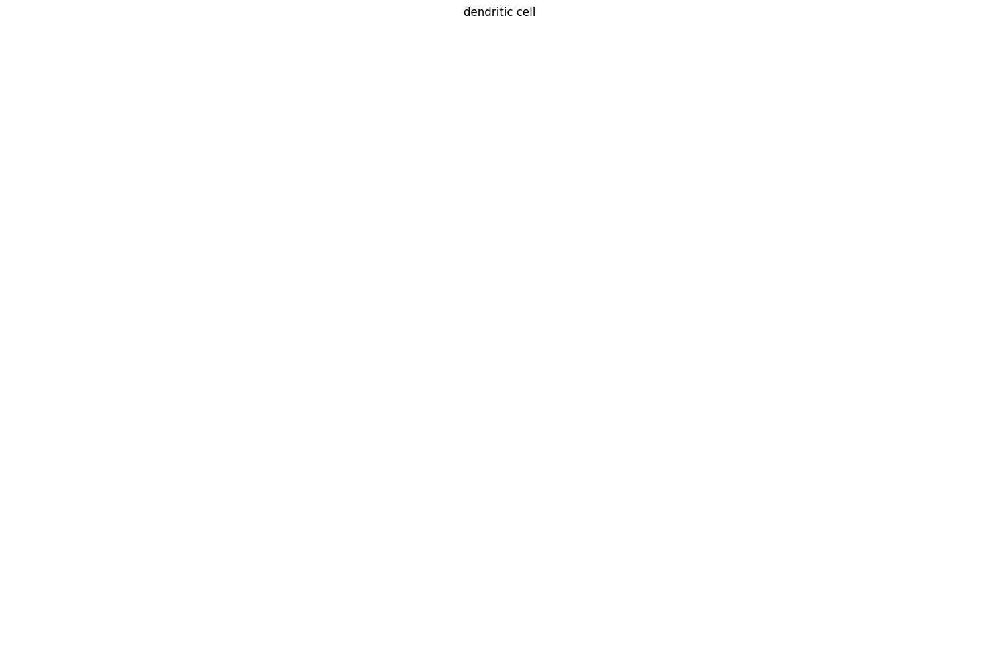

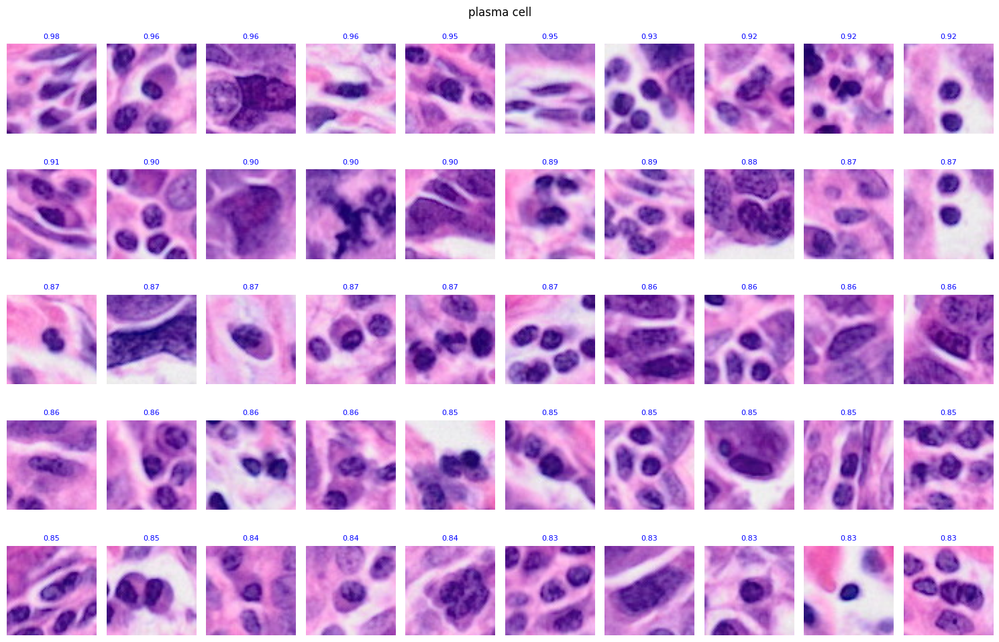

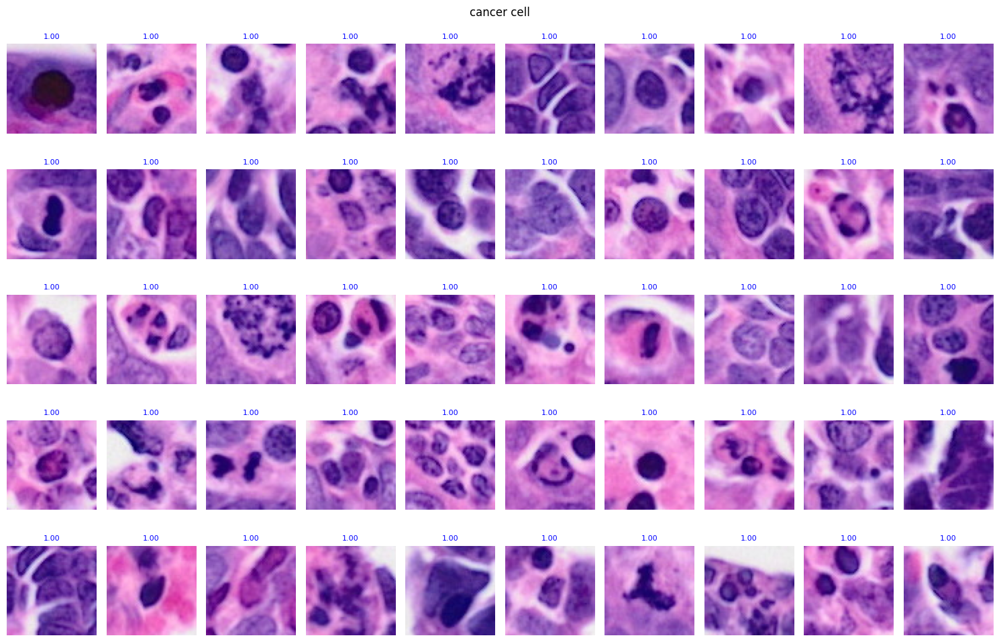

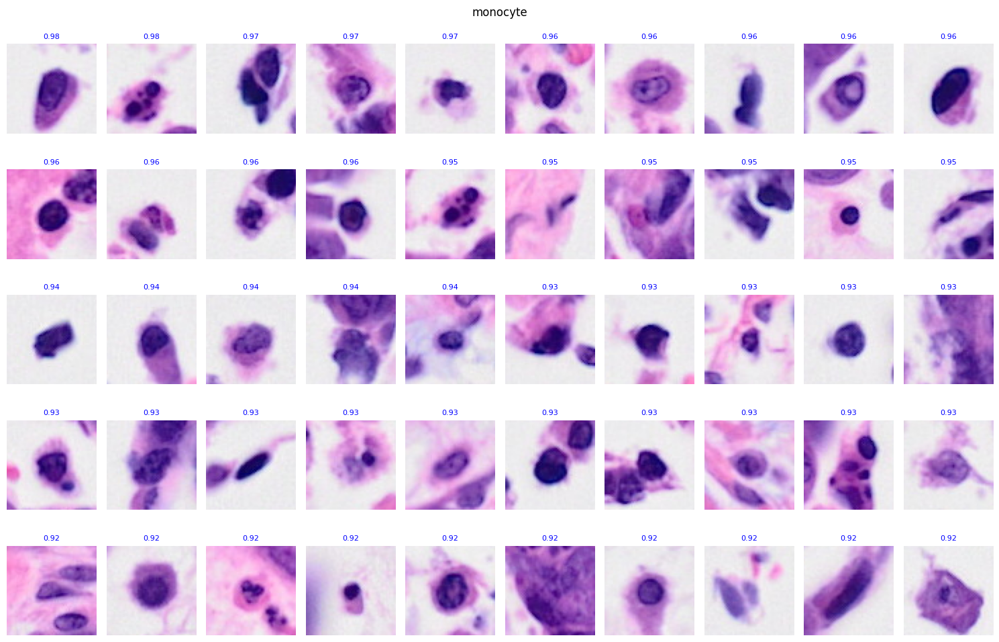

In [36]:
for ct in analyzer.ct_list:
    analyzer.plot_grid_celltype(cell_type=ct, n=50, selection="max", display=True)

Visium data found.


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.


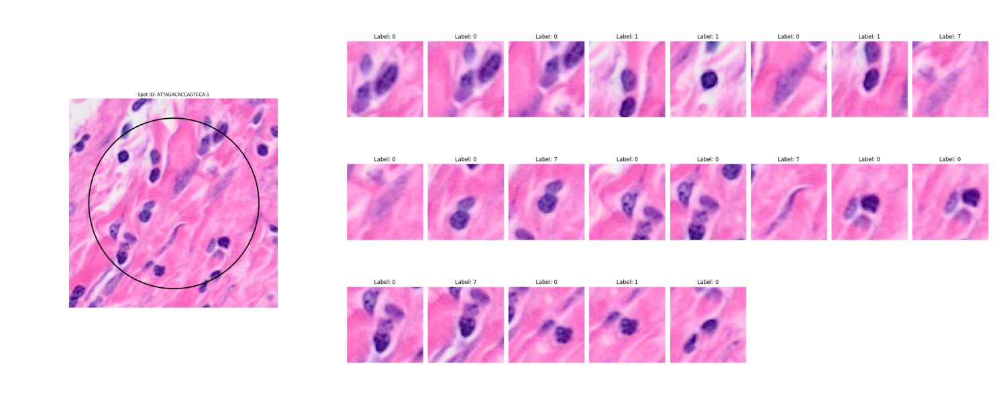

In [37]:
analyzer.plot_predicted_cell_labels_in_spot(spot_id="ATTAGACACCAGTCCA-1", display=True)

Visium data found.


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.


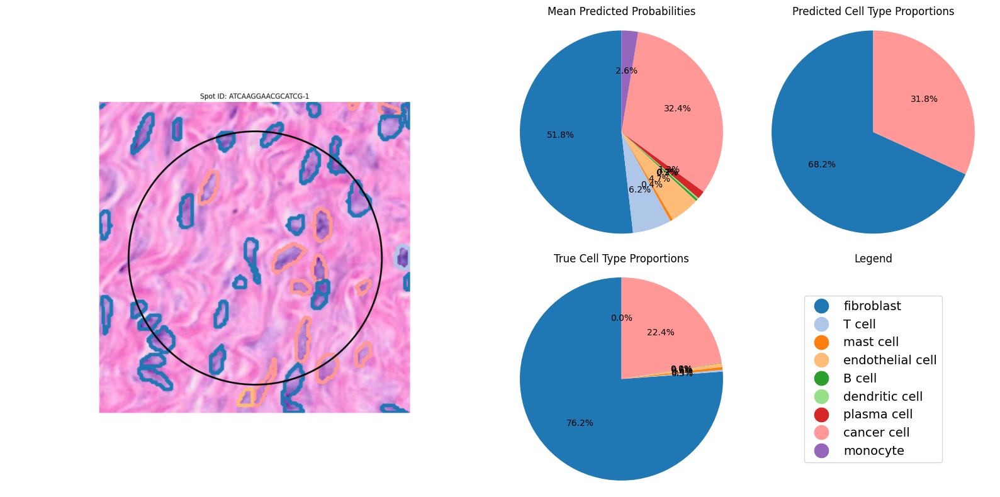

In [38]:
analyzer.plot_spot_proportions(spot_id="ATCAAGGAACGCATCG-1", draw_seg=True) #"ATTAGACACCAGTCCA-1"

# Tests on loss

In [ ]:
# from module.loss import weighted_l1_loss, weighted_l2_loss, weighted_kl_divergence

# def loss_comb(outputs, true_proportions, weights=None, agg="proba", divergence="l1", reduction="mean", alpha=0):
#     """
#     Computes the loss of the model.

#     Args:
#         outputs: The output of the model
#         true_proportions: The true proportions of the classes
#         weights: The weights of the classes. If None, the weights are set to 1.
#         agg: The aggregation method of the output. Can be "proba" or "onehot".
#         divergence: The divergence to use. Can be "l1", "l2" or "kl".
#         reduction: The reduction method of the loss. Can be "mean" or "sum".
#         alpha: The weight of the max probability loss. If not 0, we recommend a very low 
#                 value (~... for l1 and l2, ~... for kl). It also depends on 'weights'.
#     """

#     if weights is None:
#         weights = torch.ones_like(true_proportions)
#         # print("Weights : ", weights)

#     max_prob_loss = -torch.mean(torch.log(outputs.max(dim=1)[0]))
#     # print("Max prob loss : ", max_prob_loss)

#     if agg == "proba":
#         pred_proportions = outputs.mean(dim=0)
#     elif agg == "onehot":
#         predicted_classes = torch.argmax(outputs, dim=1)
#         one_hot_preds = torch.nn.functional.one_hot(predicted_classes, num_classes=outputs.size(1))
#         pred_proportions = one_hot_preds.float().sum(dim=0) / outputs.size(0)
#     else:
#         raise ValueError(f"Invalid aggregation method: {agg}. Use 'proba' or 'onehot'.")

#     # print("Pred proportions : ", pred_proportions)

#     if divergence == "l1":
#         divergence_loss = weighted_l1_loss(pred_proportions, true_proportions, weights, reduction=reduction)
#     elif divergence == "mse":
#         divergence_loss = weighted_l2_loss(pred_proportions, true_proportions, weights, reduction=reduction)
#     elif divergence == "kl":
#         divergence_loss = weighted_kl_divergence(pred_proportions, true_proportions, weights, reduction=reduction)
#     else:
#         raise ValueError(f"Invalid divergence type: {divergence}. Use 'l1', 'mse', or 'kl'.")
    
#     # print("Divergence loss : ", divergence_loss)

#     loss = alpha * max_prob_loss + (1 - alpha) * divergence_loss

#     return loss

In [ ]:
# global_proportions = proportions.mean(axis=0).values
# weights = 1.0 / global_proportions
# weights /= weights.sum()
# weights = torch.tensor(weights)

In [ ]:
# proportions["dendritic cell"].idxmax()

'GACCAGATAGCAGGCA-1'

In [ ]:
# output_0 = torch.tensor([[0, 0, 0, 0, 0, 0.01, 0, 0.99, 0], 
#                          [0, 0, 0, 0, 0, 0.01, 0, 0.99, 0],
#                          [0, 0, 0, 0, 0, 0.01, 0, 0.99, 0],
#                          [0, 0, 0, 0, 0, 0.01, 0, 0.99, 0],
#                          [0, 0, 0, 0, 0, 0.01, 0, 0.99, 0],
#                          [0, 0, 0, 0, 0, 0.01, 0, 0.99, 0]])

# output_1 = torch.tensor([[0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0], 
#                          [0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0],
#                          [0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0],
#                          [0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0],
#                          [0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0],
#                          [0.1, 0.2, 0, 0, 0, 0.05, 0, 0.65, 0]])

# output_2 = torch.tensor([[0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0], 
#                          [0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0],
#                          [0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0],
#                          [0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0],
#                          [0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0],
#                          [0.2, 0.3, 0, 0, 0.05, 0.02, 0, 0.43, 0]])

# output_3 = torch.tensor([[0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0], 
#                          [0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0],
#                          [0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0],
#                          [0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0],
#                          [0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0],
#                          [0.35, 0.5728, 0, 0, 0.05, 0, 0, 0.0272, 0]])

# output_4 = torch.tensor([[0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0], 
#                          [0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0],
#                          [0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0],
#                          [0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0],
#                          [0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0],
#                          [0.2, 0.45, 0.005, 0.01, 0.1, 0.06, 0.05, 0.125, 0]])

# output_0 = torch.where(output_0 == 0, 0.00001, output_0)
# output_1 = torch.where(output_1 == 0, 0.00001, output_1)
# output_2 = torch.where(output_2 == 0, 0.00001, output_2)
# output_3 = torch.where(output_3 == 0, 0.00001, output_3)
# output_4 = torch.where(output_4 == 0, 0.00001, output_4)

In [ ]:
# pred_proportions = output_0.mean(dim=0)
# pred_proportions

tensor([1.0000e-05, 1.0000e-05, 1.0000e-05, 1.0000e-05, 1.0000e-05, 1.0000e-02,
        1.0000e-05, 9.9000e-01, 1.0000e-05])

In [ ]:
# true_proportions = torch.tensor(proportions.loc["GACCAGATAGCAGGCA-1"].values)
# true_proportions

tensor([0.2265, 0.4667, 0.0086, 0.0099, 0.1077, 0.0747, 0.0236, 0.0273, 0.0550],
       dtype=torch.float64)

In [ ]:
# for w in [None, weights]:
#     for agg in ["proba", "onehot"]:
#         for div in ["l1", "mse", "kl"]:
#             for red in ["mean", "sum"]:
#                     print(w is not None, agg, div, red)
#                     for pred_vec in [output_0, output_1, output_2, output_3, output_4]:
#                         print(f"{float(loss_comb(pred_vec, true_proportions, weights=w, agg=agg, divergence=div, reduction=red)):.3f}")
#                         print(f"proba max: {float(-torch.mean(torch.log(pred_vec.max(dim=1)[0]))):.3f}")

In [ ]:
# divergence_loss = weighted_kl_divergence(pred_proportions, true_proportions, weights)
# divergence_loss

tensor(0.0008, dtype=torch.float64)

In [ ]:
# def weighted_kl_divergence(p, q, weights, reduction="sum"):
#     p = p.clamp(min=1e-10)
#     q = q.clamp(min=1e-10)

#     loss = p * torch.log(p / q) - p + q
#     w_loss = weights * loss

#     if reduction == "mean":
#         return w_loss.mean()
#     elif reduction == "sum":
#         return w_loss.sum()
#     else:
#         raise ValueError(f"Invalid reduction mode: {reduction}. Use 'mean' or 'sum'.")


# def shannon_entropy(U):
#     return -(U * torch.log(U + 1e-12)).sum()

# def ROT(F, z, alpha=0.5, epsilon=1, n_iter=75, weights=None, reduction="sum"):
#     """
#     Compute a differentiable approximation to f_relax-ent using Algorithm 1.

#     Args:
#         F (torch.Tensor): Tensor of shape (n, k) representing the predicted probability distributions.
#         z (torch.Tensor): Tensor of shape (k,) representing the target distribution.
#         alpha (float): Smoothing parameter in [0, 1].
#         epsilon (float): Entropy parameter, must be > 0.
#         n_iter (int): Number of Sinkhorn iterations.

#     Returns:
#         torch.Tensor: The differentiable approximation to f_relax-ent(F, z).
#     """
#     n, _ = F.shape
#     # Step 1: Initialize variables
#     K = F.pow(1 / epsilon)
#     K = K.t()

#     tau = (1 + alpha * epsilon / (1 - alpha)) ** -1

#     b = torch.ones(n, device=F.device)

#     # Steps 2-3: Perform Sinkhorn iterations
#     for _ in range(n_iter):
#         # Update a
#         a = ((n * z / (K @ b)).pow(tau))
#         print(a.dtype)
#         # Update b
#         b = (torch.ones(n, device=F.device) / (K.t() @ a))

#     # Step 6: Compute U
#     U = torch.diag(a) @ K @ torch.diag(b)

#     # Step 7: Compute the final approximation to f_relax-ent
#     trace_logF_U = torch.trace(torch.log(F) @ U)
#     entropy_U = shannon_entropy(U)
#     kld = weighted_kl_divergence(U @ torch.ones(n, device=F.device) / n, z, weights=weights, reduction=reduction)

#     # Compute the final differentiable approximation
#     return (alpha / n) * (-trace_logF_U - epsilon * entropy_U) + (1 - alpha) * kld

In [ ]:
# true_proportions

In [ ]:
# ROT(output_0, true_proportions, alpha=0.5, epsilon=1, n_iter=75, weights=torch.ones(9), reduction="sum")

# For extracting some metrics

In [ ]:
# import os
# import itertools
# from tools.analysis import evaluate_spot_predictions, get_predicted_proportions
# import pandas as pd

# def aggregate_metrics(metrics_list):
#     """Calculate the mean for each metric across multiple runs."""
#     mean_metrics = pd.DataFrame(metrics_list).mean().to_dict()
#     return mean_metrics

# output_dir = "../out/rot"
# alphas = [0.3]
# learning_rates = [1e-5]
# weights_options = [True, False]
# seeds = [42, 43, 44, 45, 46, 47]

# results_best = []
# results_best_adj = []
# results_final = []
# results_final_adj = []
# combinations = list(itertools.product(alphas, learning_rates, weights_options))

# for alpha, lr, weights in combinations:
#     metrics_best_list = []
#     metrics_best_adj_list = []
#     metrics_final_list = []
#     metrics_final_adj_list = []

#     for seed in range(42, 48):
#         info_path = os.path.join(
#             output_dir,
#             f"alpha_{alpha}_lr_{lr}_weights_{weights}_divergence_rot_seed_{seed}",
#             "info.pickle",
#         )
#         if os.path.exists(info_path):
#             print("Seed ", seed, " exists")
#             with open(info_path, "rb") as f:
#                 info = pickle.load(f)

#             spot_dict = info["spot_dict"]
#             true_proportions = info["proportions"]
#             pred_best = info["pred_best"]
#             pred_best_adj = info["pred_best_adjusted"]

#             is_final = True
#             try:
#                 pred_final = info["pred_final"]
#                 pred_final_adj = info["pred_final_adjusted"]
#             except Exception:
#                 is_final = False

#             # Load true and predicted proportions
#             predicted_best_proportions = get_predicted_proportions(pred_best, spot_dict)
#             predicted_best_proportions_adj = get_predicted_proportions(pred_best_adj, spot_dict)

#             if is_final:
#                 predicted_final_proportions = get_predicted_proportions(pred_final, spot_dict)
#                 predicted_final_proportions_adj = get_predicted_proportions(pred_final_adj, spot_dict)

#             # Evaluate the metrics
#             metrics_best = evaluate_spot_predictions(true_proportions, predicted_best_proportions)
#             metrics_best_adj = evaluate_spot_predictions(true_proportions, predicted_best_proportions_adj)

#             if is_final:
#                 metrics_final = evaluate_spot_predictions(true_proportions, predicted_final_proportions)
#                 metrics_final_adj = evaluate_spot_predictions(true_proportions, predicted_final_proportions_adj)

#             metrics_best_list.append(metrics_best)
#             metrics_best_adj_list.append(metrics_best_adj)

#             if is_final:
#                 metrics_final_list.append(metrics_final)
#                 metrics_final_adj_list.append(metrics_final_adj)

#     mean_metrics_best = aggregate_metrics(metrics_best_list)
#     mean_metrics_best_adj = aggregate_metrics(metrics_best_adj_list)
#     mean_metrics_final = aggregate_metrics(metrics_final_list)
#     mean_metrics_final_adj = aggregate_metrics(metrics_final_adj_list)

#     result_best = {"alpha": alpha, "lr": lr, "weights": weights, "divergence": "rot", **mean_metrics_best}
#     result_best_adj = {
#         "alpha": alpha,
#         "lr": lr,
#         "weights": weights,
#         "divergence": "rot",
#         **mean_metrics_best_adj,
#     }
#     result_final = {"alpha": alpha, "lr": lr, "weights": weights, "divergence": "rot", **mean_metrics_final}
#     result_final_adj = {
#         "alpha": alpha,
#         "lr": lr,
#         "weights": weights,
#         "divergence": "rot",
#         **mean_metrics_final_adj,
#     }

#     results_best.append(result_best)
#     results_best_adj.append(result_best_adj)
#     results_final.append(result_final)
#     results_final_adj.append(result_final_adj)

# # Save final results
# results_df_best = pd.DataFrame(results_best)
# results_df_best_adj = pd.DataFrame(results_best_adj)
# results_df_final = pd.DataFrame(results_final)
# results_df_final_adj = pd.DataFrame(results_final_adj)

# results_df_best.to_csv(os.path.join(output_dir, f"summary_metrics_rot_best.csv"), index=False)
# results_df_best_adj.to_csv(os.path.join(output_dir, f"summary_metrics_rot_best_adj.csv"), index=False)
# results_df_final.to_csv(os.path.join(output_dir, f"summary_metrics_rot_final.csv"), index=False)
# results_df_final_adj.to_csv(os.path.join(output_dir, f"summary_metrics_rot_final_adj.csv"), index=False)

# Test on loaders

In [ ]:
# from module.load_data import SpotDataset, split_data

# train_spot_dict, train_proportions, val_spot_dict, val_proportions, test_spot_dict, test_proportions = split_data(
#     spot_dict, proportions, train_size=0.5, val_size=0.25, rs=42
# )

# # Create datasets
# train_dataset = SpotDataset(train_spot_dict, train_proportions, image_dict)
# val_dataset = SpotDataset(val_spot_dict, val_proportions, image_dict)
# test_dataset = SpotDataset(test_spot_dict, test_proportions, image_dict)

# # Create dataloaders
# train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=1, shuffle=True)
# val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, shuffle=False)
# test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)